<a href="https://colab.research.google.com/github/DaniDelgon/MRI_Neural_Segmentation/blob/main/MRI_Neural_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this notebook we are implementing a U-net type of Neural Network for Image segmentation over a dataset of mri images with its correspondent masks for tumor segmentation. This dataset is provided via kaggle API, this dataset (Segmentation masks for FLAIR abnormality approved by a board-certified radiologist at Duke University) can be found in this website: https://wiki.cancerimagingarchive.net/display/Public/TCGA-LGG

We first download the dataset with the help of the API of kaggle. To do that we have to have the json file with our own key in the same folder that out notebook is running.

#Dataset

In [ ]:
#Download of some libraries that could help us
!pip install kaggle
!pip install visualkeras

In the next code cells with interact with the kaggle's json file with our key for the download of the mri dataset.

In [9]:
!mkdir -p ~/.kaggle

In [10]:
!cp kaggle.json ~/.kaggle/

In [11]:
!chmod 600 ~/.kaggle/kaggle.json

In [12]:
!kaggle datasets download -d mateuszbuda/lgg-mri-segmentation

 99% 708M/714M [00:05<00:00, 180MB/s]
100% 714M/714M [00:05<00:00, 145MB/s]


In [13]:
#Checking of the zip file with the dataset in the folder we are currently in
!ls

kaggle.json  lgg-mri-segmentation.zip  sample_data


In [14]:
import zipfile

#Decompress the dataset file
zip_ref = zipfile.ZipFile('lgg-mri-segmentation.zip', 'r')
zip_ref.extractall('files')
zip_ref.close()

In [ ]:
import os
from os import listdir
from os.path import isfile, join

#List with ids of every patient
name_folders=listdir('/content/files/lgg-mri-segmentation/kaggle_3m/')

#Checking of the number of ids and list of ids
print(len(name_folders))

In [16]:
#Removing of some files we dont need in the ids' list
name_folders.remove('README.md')
name_folders.remove('data.csv')

In [17]:
import random
import numpy as np
import tensorflow as tf

#Seed setting for the reproducibility of the proof of concept
def set_seed(seed):
  random.seed(seed)
  np.random.seed(seed)
  tf.random.set_seed(seed)

In [18]:
#Function for the train/test partition over a list
def list_dataset_split(list,train_test_partition,shuffle):
  if shuffle==True:
    random.shuffle(list)
  split_index=len(list)-int(train_test_partition*len(list))
  train_split=list[:split_index]
  test_split=list[split_index:]
  return train_split,test_split

#We divide our ids lists in train ids and test ids
train_names,test_names=list_dataset_split(name_folders,train_test_partition=0.1,shuffle=True)

In [19]:
DATASET_FOLDER_PATH='/content/files/lgg-mri-segmentation/kaggle_3m/'

In this cell of code, we append the images of the train ids in a list of train images and masks and do the same process for the test side.

In [20]:
import numpy as np
import cv2
import re

X_train=[]   #Images list
y_train=[]   #Masks list
IMG_SIZE=128   

print('--------------DATASET DE ENTRENAMIENTO---------------')
for k in train_names:
  print(k)
  image_names = [f for f in listdir(DATASET_FOLDER_PATH+k) if isfile(join(DATASET_FOLDER_PATH+k, f))]
  image_names=sorted(image_names)
  print(str(len(image_names))+' images.\n')
  mask_names = sorted([s for s in image_names if "mask" in s])
  image_names = sorted([s for s in image_names if not "mask" in s])
  mask_names.sort(key=lambda x: int(x.split('_')[4]))
  image_names.sort(key=lambda x: int(x.split('_')[4][:-4]))
  for img1,img2 in zip(image_names,mask_names):
    mri_image=cv2.imread(DATASET_FOLDER_PATH+k+'/'+img1)
    mask_image=cv2.imread(DATASET_FOLDER_PATH+k+'/'+img2)
    if np.sum(mask_image)>0:    #PONER CONDICION
      X_train.append(cv2.resize(mri_image,(IMG_SIZE, IMG_SIZE)))
      y_train.append((cv2.resize(mask_image,(IMG_SIZE, IMG_SIZE))[:,:,0]>0)*1)

X_test=[]
y_test=[]

print('\n--------------DATASET DE TEST---------------')
for k in test_names:
  print(k)
  image_names = [f for f in listdir(DATASET_FOLDER_PATH+k) if isfile(join(DATASET_FOLDER_PATH+k, f))]
  image_names=sorted(image_names)
  print(str(len(image_names))+' images.\n')
  mask_names = sorted([s for s in image_names if "mask" in s])
  image_names = sorted([s for s in image_names if not "mask" in s])
  mask_names.sort(key=lambda x: int(x.split('_')[4]))
  image_names.sort(key=lambda x: int(x.split('_')[4][:-4]))
  for img1,img2 in zip(image_names,mask_names):
    mri_image=cv2.imread(DATASET_FOLDER_PATH+k+'/'+img1)
    mask_image=cv2.imread(DATASET_FOLDER_PATH+k+'/'+img2)
    if np.sum(mask_image)>0:    #PONER CONDICION
      X_test.append(cv2.resize(mri_image,(IMG_SIZE, IMG_SIZE)))
      y_test.append((cv2.resize(mask_image,(IMG_SIZE, IMG_SIZE))[:,:,0]>0)*1)

--------------DATASET DE ENTRENAMIENTO---------------
TCGA_HT_7855_19951020
42 images.

TCGA_DU_8167_19970402
74 images.

TCGA_CS_6665_20010817
48 images.

TCGA_FG_6689_20020326
96 images.

TCGA_CS_6668_20011025
56 images.

TCGA_CS_4941_19960909
46 images.

TCGA_HT_A616_19991226
56 images.

TCGA_DU_5872_19950223
142 images.

TCGA_DU_7299_19910417
72 images.

TCGA_CS_5395_19981004
40 images.

TCGA_DU_6400_19830518
114 images.

TCGA_HT_8018_19970411
40 images.

TCGA_CS_6666_20011109
52 images.

TCGA_CS_6669_20020102
44 images.

TCGA_DU_5871_19941206
72 images.

TCGA_HT_7884_19980913
40 images.

TCGA_CS_6667_20011105
40 images.

TCGA_DU_A5TS_19970726
70 images.

TCGA_HT_A5RC_19990831
64 images.

TCGA_FG_6690_20020226
120 images.

TCGA_HT_7602_19951103
40 images.

TCGA_HT_7879_19981009
56 images.

TCGA_DU_A5TT_19980318
112 images.

TCGA_HT_8107_19980708
40 images.

TCGA_HT_8114_19981030
44 images.

TCGA_FG_5964_20010511
52 images.

TCGA_DU_7302_19911203
72 images.

TCGA_CS_6186_20000601
50

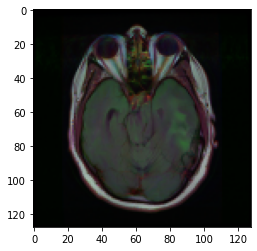

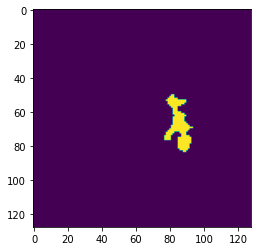

_________


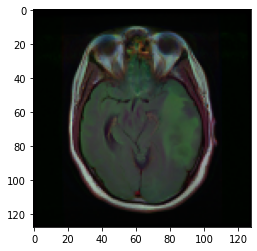

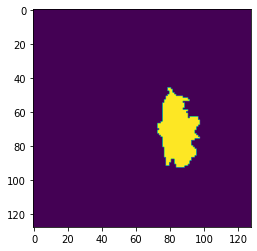

_________


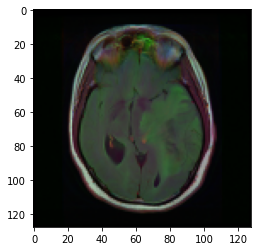

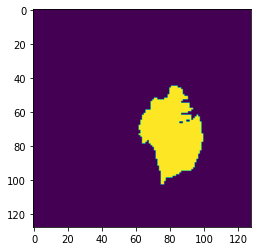

_________


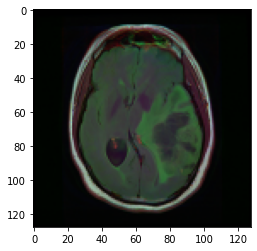

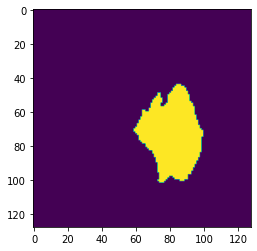

_________


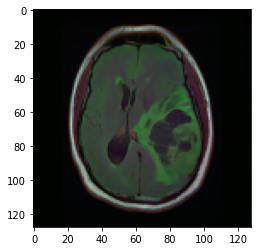

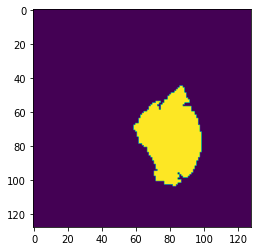

_________


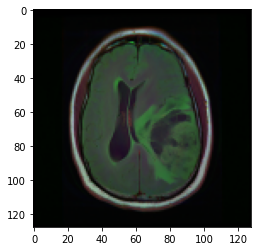

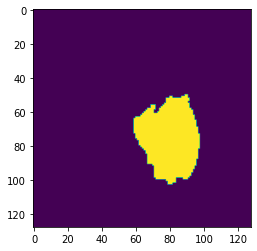

_________


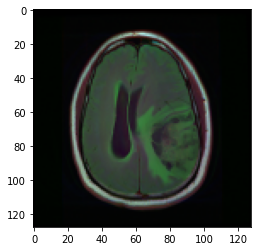

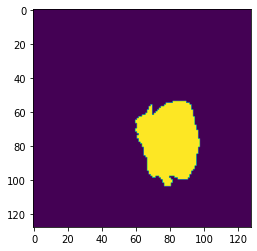

_________


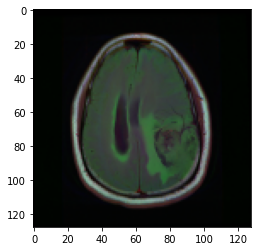

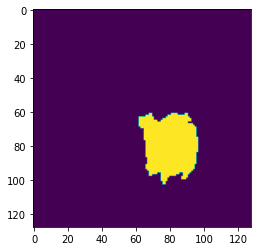

_________


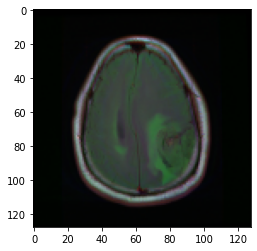

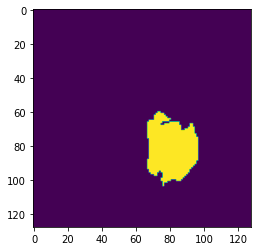

_________


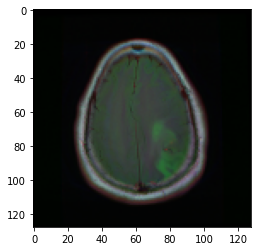

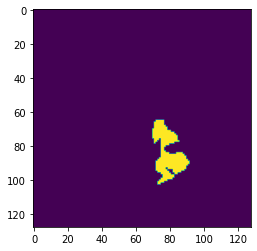

_________


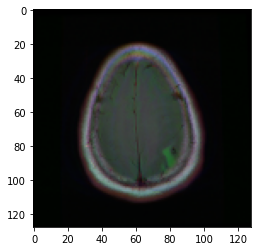

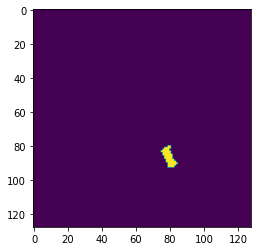

_________


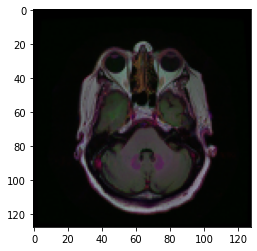

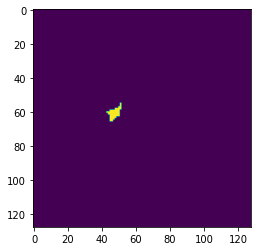

_________


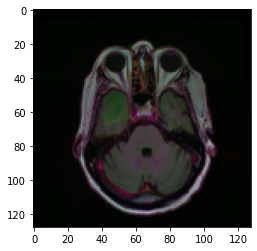

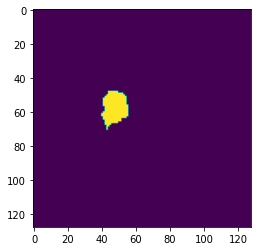

_________


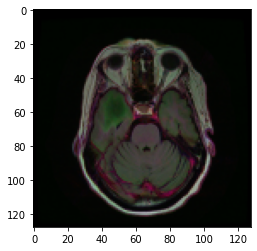

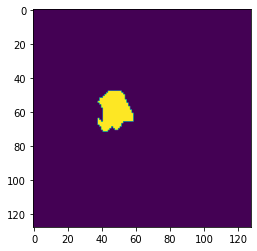

_________


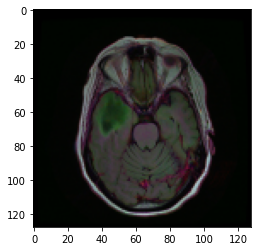

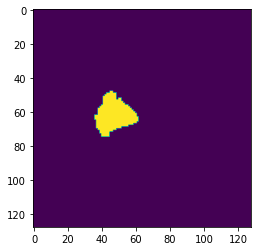

_________


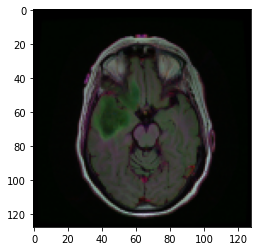

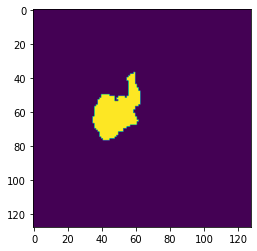

_________


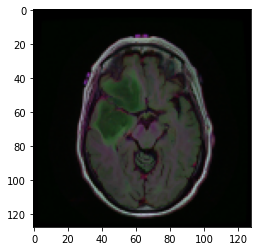

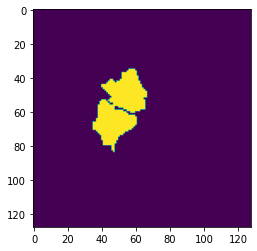

_________


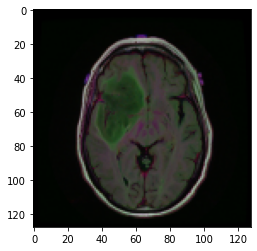

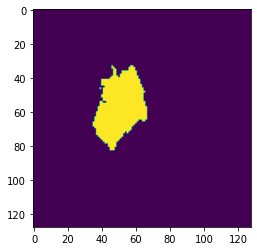

_________


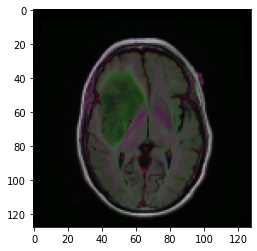

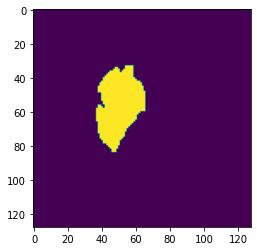

_________


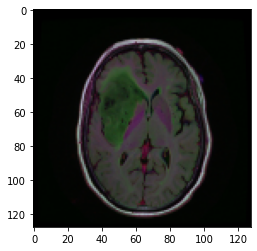

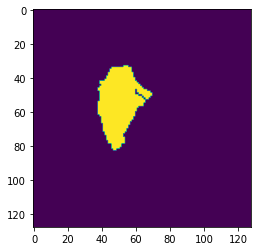

_________


In [21]:
import matplotlib.pyplot as plt

#Sanity check in the visualization of images and its correspodent masks
for k in range(0,20):
  plt.imshow(X_train[k])
  plt.show()

  plt.imshow(y_train[k])
  plt.show()
  print('_________')

#Convolutional Neural Network

In [22]:
import tensorflow as tf
import keras

IMG_WIDTH = 128
IMG_HEIGHT = 128
IMG_CHANNELS = 3
init='he_normal'
act='relu'    #tf.keras.layers.LeakyReLU()

def unet_model(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS,init,act,dropout_level):
  #Build the model
  inputs = tf.keras.layers.Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  s = tf.keras.layers.Lambda(lambda x: x / 255)(inputs)

  #Contraction path
  c1 = tf.keras.layers.Conv2D(16, (3, 3), activation=act, kernel_initializer=init, padding='same')(s)
  c1 = tf.keras.layers.Dropout(dropout_level)(c1)
  c1 = tf.keras.layers.Conv2D(16, (3, 3), activation=act, kernel_initializer=init, padding='same')(c1)
  p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

  c2 = tf.keras.layers.Conv2D(32, (3, 3), activation=act, kernel_initializer=init, padding='same')(p1)
  c2 = tf.keras.layers.Dropout(dropout_level)(c2)
  c2 = tf.keras.layers.Conv2D(32, (3, 3), activation=act, kernel_initializer=init, padding='same')(c2)
  p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)
  
  c3 = tf.keras.layers.Conv2D(64, (3, 3), activation=act, kernel_initializer=init, padding='same')(p2)
  c3 = tf.keras.layers.Dropout(dropout_level)(c3)
  c3 = tf.keras.layers.Conv2D(64, (3, 3), activation=act, kernel_initializer=init, padding='same')(c3)
  p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)
  
  c4 = tf.keras.layers.Conv2D(128, (3, 3), activation=act, kernel_initializer=init, padding='same')(p3)
  c4 = tf.keras.layers.Dropout(dropout_level)(c4)
  c4 = tf.keras.layers.Conv2D(128, (3, 3), activation=act, kernel_initializer=init, padding='same')(c4)
  p4 = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(c4)
  
  c5 = tf.keras.layers.Conv2D(256, (3, 3), activation=act, kernel_initializer=init, padding='same')(p4)
  c5 = tf.keras.layers.Dropout(dropout_level+0.1)(c5)
  c5 = tf.keras.layers.Conv2D(256, (3, 3), activation=act, kernel_initializer=init, padding='same')(c5)

  #Expansive path 
  u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
  u6 = tf.keras.layers.concatenate([u6, c4])
  c6 = tf.keras.layers.Conv2D(128, (3, 3), activation=act, kernel_initializer=init, padding='same')(u6)
  c6 = tf.keras.layers.Dropout(dropout_level)(c6)
  c6 = tf.keras.layers.Conv2D(128, (3, 3), activation=act, kernel_initializer=init, padding='same')(c6)
  
  u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
  u7 = tf.keras.layers.concatenate([u7, c3])
  c7 = tf.keras.layers.Conv2D(64, (3, 3), activation=act, kernel_initializer=init, padding='same')(u7)
  c7 = tf.keras.layers.Dropout(dropout_level)(c7)
  c7 = tf.keras.layers.Conv2D(64, (3, 3), activation=act, kernel_initializer=init, padding='same')(c7)
  
  u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
  u8 = tf.keras.layers.concatenate([u8, c2])
  c8 = tf.keras.layers.Conv2D(32, (3, 3), activation=act, kernel_initializer=init, padding='same')(u8)
  c8 = tf.keras.layers.Dropout(dropout_level)(c8)
  c8 = tf.keras.layers.Conv2D(32, (3, 3), activation=act, kernel_initializer=init, padding='same')(c8)
  
  u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
  u9 = tf.keras.layers.concatenate([u9, c1], axis=3)
  c9 = tf.keras.layers.Conv2D(16, (3, 3), activation=act, kernel_initializer=init, padding='same')(u9)
  c9 = tf.keras.layers.Dropout(dropout_level)(c9)
  c9 = tf.keras.layers.Conv2D(16, (3, 3), activation=act, kernel_initializer=init, padding='same')(c9)
  
  outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)
  
  model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
  return model

model=unet_model(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS,init,act,dropout_level=0.2)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

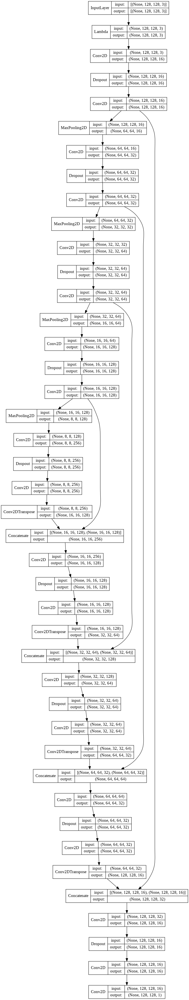

In [23]:
#Plotting of the architecture of our model
keras.utils.vis_utils.plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=False)

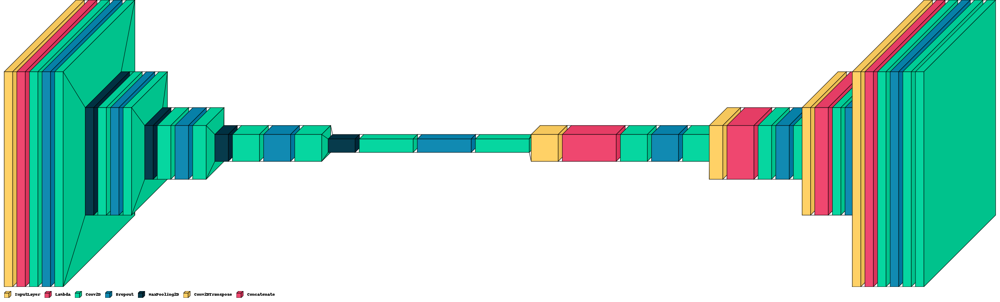

In [24]:
import visualkeras

#Visualization of a diagram of the architecture of the model
visualkeras.layered_view(model, scale_xy=4, scale_z=0.5, legend=True,max_xy=1000, max_z=1000)

In [25]:
callbacks = [tf.keras.callbacks.EarlyStopping(patience=20, monitor='val_accuracy'),tf.keras.callbacks.TensorBoard(log_dir='logs')]

results_1 = model.fit(np.array(X_train), np.array(y_train), validation_split=0.1, batch_size=16, epochs=200, callbacks=callbacks)

Epoch 1/200
71/71 [==============================] - 15s 65ms/step - loss: 0.1451 - accuracy: 0.9555 - val_loss: 0.0811 - val_accuracy: 0.9732
Epoch 2/200
71/71 [==============================] - 3s 41ms/step - loss: 0.0689 - accuracy: 0.9676 - val_loss: 0.0666 - val_accuracy: 0.9732
Epoch 3/200
71/71 [==============================] - 3s 41ms/step - loss: 0.0635 - accuracy: 0.9676 - val_loss: 0.0642 - val_accuracy: 0.9732
Epoch 4/200
71/71 [==============================] - 3s 41ms/step - loss: 0.0609 - accuracy: 0.9713 - val_loss: 0.0636 - val_accuracy: 0.9809
Epoch 5/200
71/71 [==============================] - 3s 42ms/step - loss: 0.0574 - accuracy: 0.9792 - val_loss: 0.0577 - val_accuracy: 0.9799
Epoch 6/200
71/71 [==============================] - 3s 42ms/step - loss: 0.0541 - accuracy: 0.9810 - val_loss: 0.0605 - val_accuracy: 0.9756
Epoch 7/200
71/71 [==============================] - 3s 42ms/step - loss: 0.0489 - accuracy: 0.9825 - val_loss: 0.0602 - val_accuracy: 0.9838
Epoch

#Results Displaying

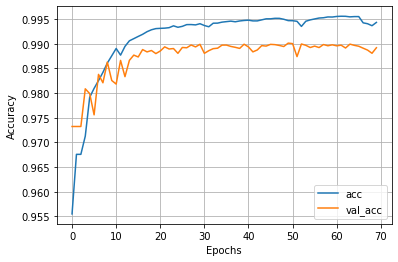

In [26]:
#Display of the accuracy of the model over the training epochs
plt.plot(results_1.history['accuracy'],label='acc')
plt.plot(results_1.history['val_accuracy'],label='val_acc')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()

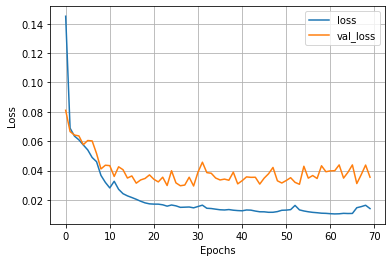

In [27]:
#Display of the loss of the model over the training epochs
plt.plot(results_1.history['loss'],label='loss')
plt.plot(results_1.history['val_loss'],label='val_loss')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

In [28]:
#Function for plotting the mri image its correspodent predicted and ground truth mask with a certain transparency in the same figure
def seg_plot(rad,ground_truth,prediction):
  fig, (ax1, ax2) = plt.subplots(1, 2)
  #fig.suptitle('MRI segmentation')
  ax1.imshow(rad)
  ax1.imshow(ground_truth,alpha=0.3)
  ax1.set_title('Ground Truth')

  ax2.imshow(rad)
  ax2.imshow(prediction,alpha=0.3)
  ax2.set_title('Predicted')

In [29]:
#Prediction of the test partition
preds_test=model.predict(np.array(X_test))

4/4 [==============================] - 1s 179ms/step


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


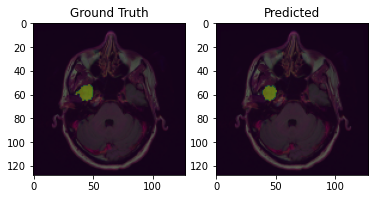

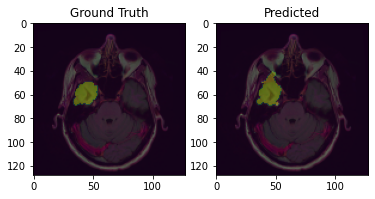

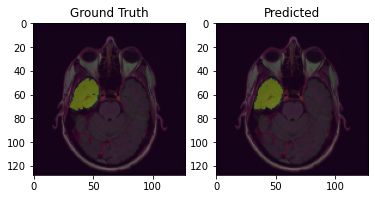

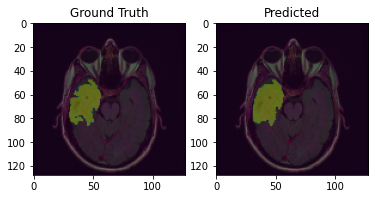

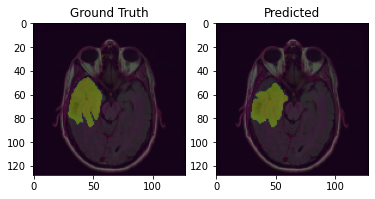

...

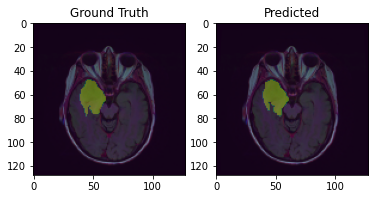

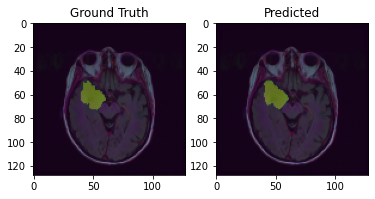

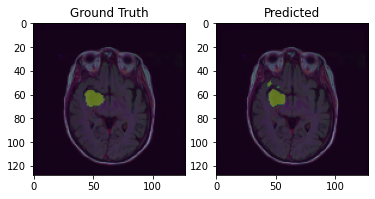

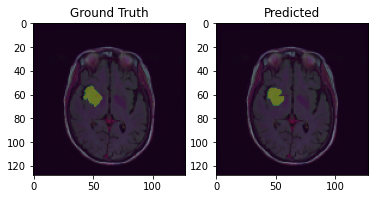

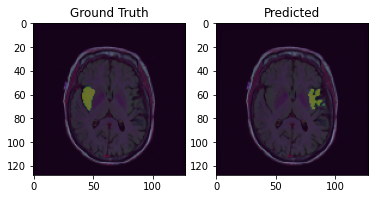

In [30]:
#Visualization of the prediction of the model over the ground truth in some test images.
for ind in range(0,50):
  seg_plot(X_test[ind],y_test[ind].squeeze(),np.around(preds_test[ind].squeeze()))

It is visible that in some cases the results are acceptable but in general, our first model has a big room for improvement. We are gonna make 2 major improvements over the model, that are data shuffling and the implementation of the loss on the Jaccard metric, which is a very useful metric for the segmentation of images.

#Implementing Jaccard and improvements on the Image Dataset

This time, we are going to repeat all the process, but implementing some improvements for the model and the dataset that we are using.

First, we are going to append all images and mask in two correspondent list and we are going to shuffle its elements in the same order, then we are going to split this dataset into train and test, so we have images arrenged independent of its id in the train or test partition.

This is because maybe some of the images maybe have some patients have mris in different machine, so the image is taken with different details over different patients.

In [31]:
#All masks and images in  two different lists
all_images=np.concatenate((X_train,X_test))
all_masks=np.concatenate((y_train,y_test))

In [32]:
#Train/test partiotion after shuffling the dataset
random.seed(0)
X_train,X_test=list_dataset_split(all_images,train_test_partition=0.1,shuffle=True)
random.seed(0)
y_train,y_test=list_dataset_split(all_masks,train_test_partition=0.1,shuffle=True)

In [33]:
print(type(X_train))
print(len(X_train))

<class 'numpy.ndarray'>
1236


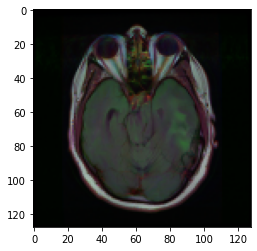

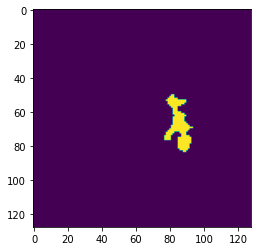

_________


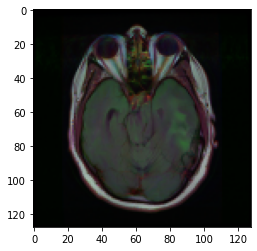

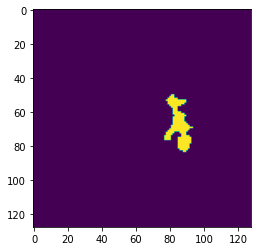

_________


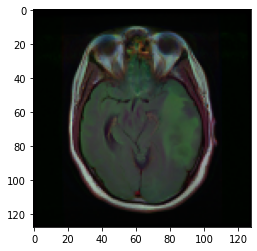

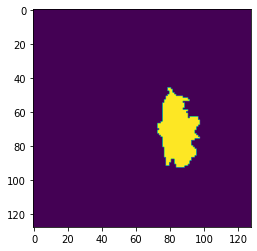

_________


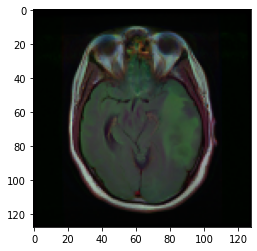

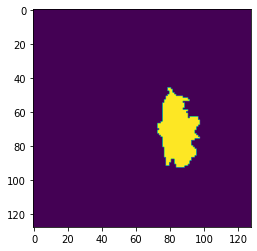

_________


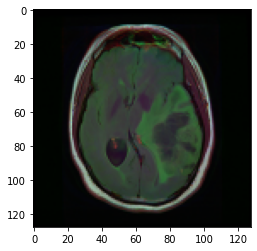

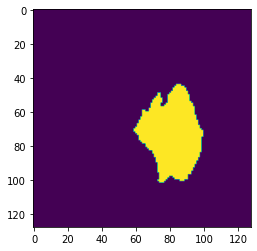

_________


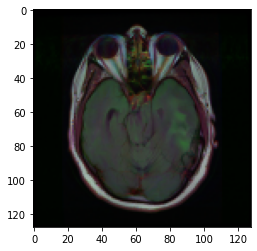

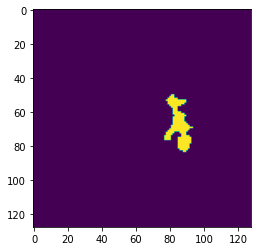

_________


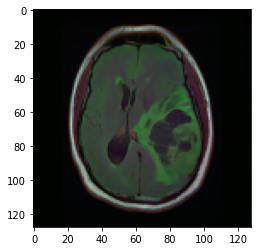

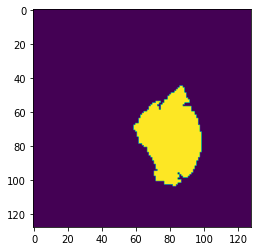

_________


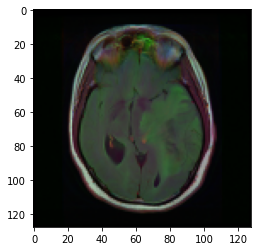

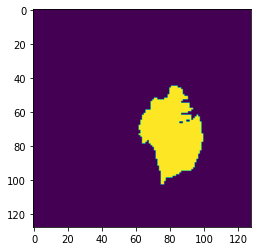

_________


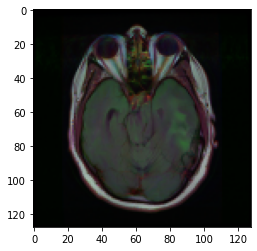

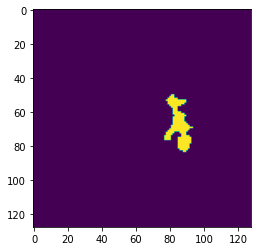

_________


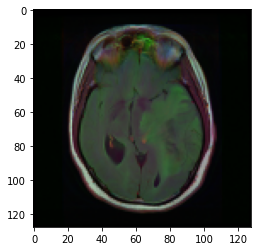

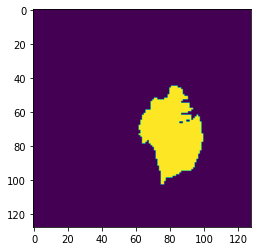

_________


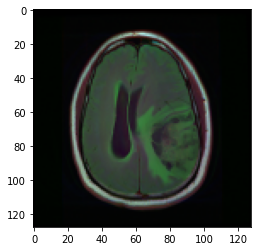

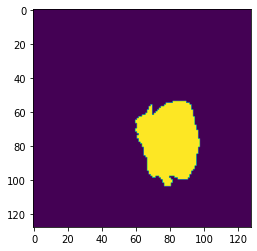

_________


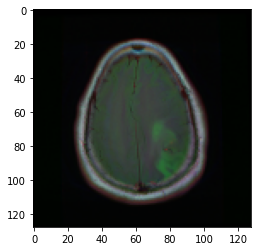

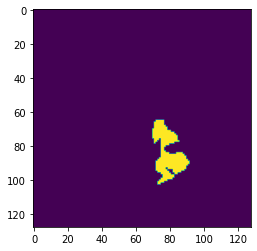

_________


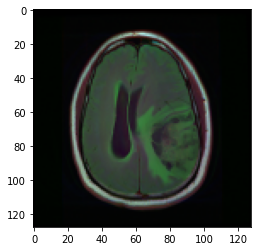

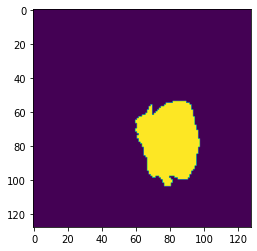

_________


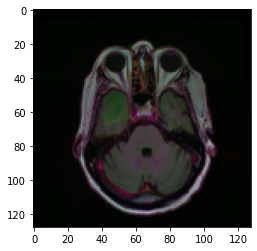

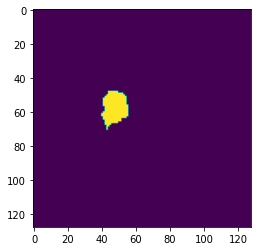

_________


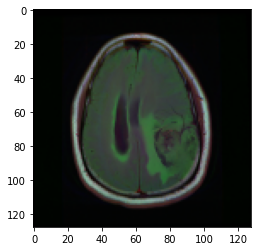

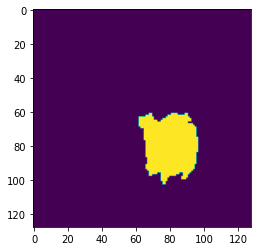

_________


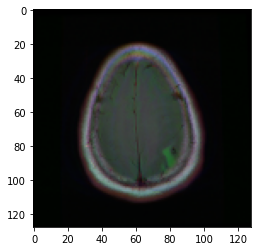

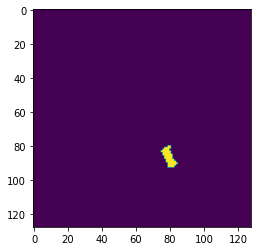

_________


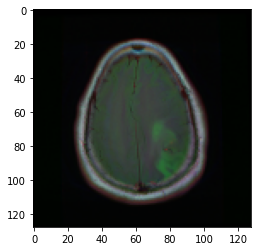

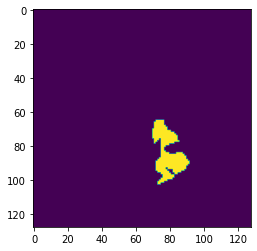

_________


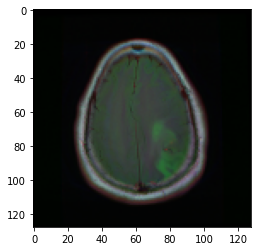

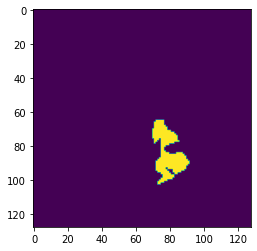

_________


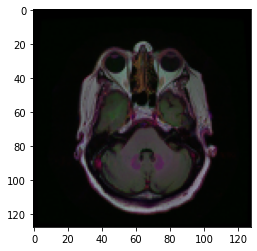

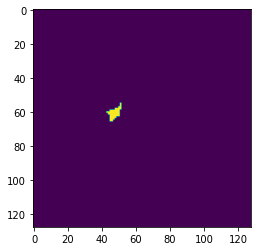

_________


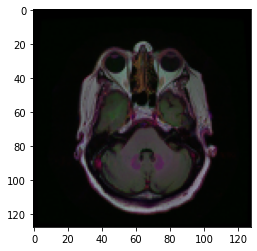

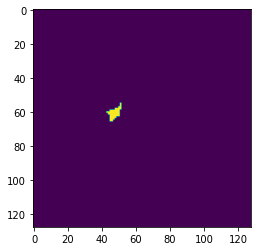

_________


In [34]:
import matplotlib.pyplot as plt

#Sanity check with visualization of mri images and its correspodent masks
for k in range(0,20):
  plt.imshow(X_train[k])
  plt.show()

  plt.imshow(y_train[k])
  plt.show()
  print('_________')

The Jaccard index, also known as the Jaccard similarity coefficient, is a statistic used for gauging the similarity and diversity of sample sets. It was developed by Grove Karl Gilbert in 1884 as his ratio of verification:

$Jaccard(A,B) = \frac{|A \cap B|}{|A \cup B|}$

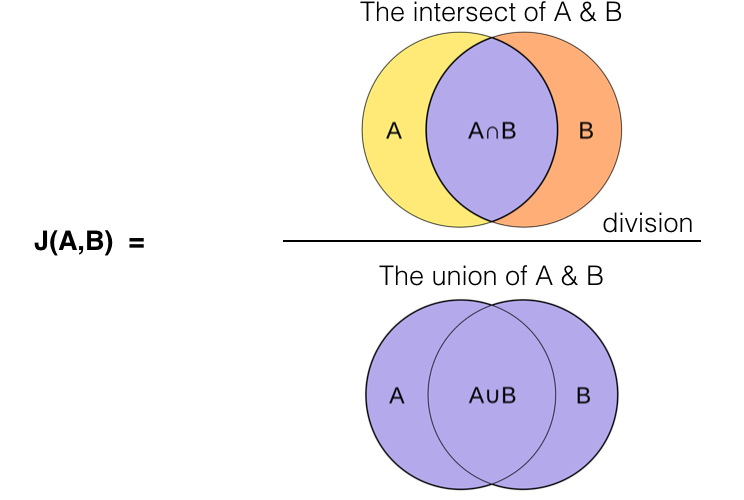

In [35]:
from keras import backend as K

#Function in which the Jaccard metric is defined
def jacard_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)


def jacard_coef_loss(y_true, y_pred):
    return -jacard_coef(y_true, y_pred)  # -1 ultiplied as we want to minimize this value as loss function

In [36]:
#Now, we set the model's loss with the Jaccard metric 
set_seed(0)
model=unet_model(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS,init,act=tf.keras.layers.LeakyReLU(alpha=0.1),dropout_level=0.2)
model.compile(optimizer = 'adam', loss = [jacard_coef_loss], metrics = [jacard_coef,'accuracy',])

In [37]:
#Arrays in float64 for the traing of the model with the Jaccard loss
X_train=np.array(X_train).astype('float64')
y_train=np.array(y_train).astype('float64')

In [38]:
#Training of the model
callbacks = [tf.keras.callbacks.EarlyStopping(patience=20, monitor='val_jacard_coef',mode='max'),tf.keras.callbacks.TensorBoard(log_dir='logs')]

results_2 = model.fit(np.array(X_train), np.array(y_train), validation_split=0.1, batch_size=16, epochs=200, callbacks=callbacks)

Epoch 1/200
70/70 [==============================] - 7s 70ms/step - loss: -0.2777 - jacard_coef: 0.2801 - accuracy: 0.7913 - val_loss: -0.5055 - val_jacard_coef: 0.5014 - val_accuracy: 0.9751
Epoch 2/200
70/70 [==============================] - 4s 51ms/step - loss: -0.5064 - jacard_coef: 0.5057 - accuracy: 0.9792 - val_loss: -0.5291 - val_jacard_coef: 0.5257 - val_accuracy: 0.9786
Epoch 3/200
70/70 [==============================] - 4s 53ms/step - loss: -0.5492 - jacard_coef: 0.5490 - accuracy: 0.9823 - val_loss: -0.5996 - val_jacard_coef: 0.5924 - val_accuracy: 0.9847
Epoch 4/200
70/70 [==============================] - 4s 50ms/step - loss: -0.6060 - jacard_coef: 0.6061 - accuracy: 0.9853 - val_loss: -0.6143 - val_jacard_coef: 0.6094 - val_accuracy: 0.9829
Epoch 5/200
70/70 [==============================] - 3s 46ms/step - loss: -0.6271 - jacard_coef: 0.6274 - accuracy: 0.9864 - val_loss: -0.6809 - val_jacard_coef: 0.6761 - val_accuracy: 0.9875
Epoch 6/200
70/70 [=====================

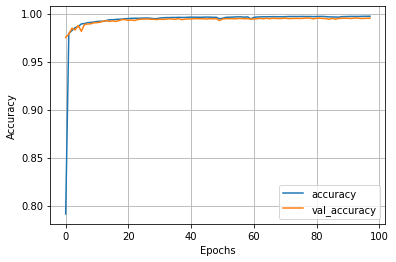

In [39]:
#Display of the accuracy of the model over the training epochs
plt.plot(results_2.history['accuracy'],label='accuracy')
plt.plot(results_2.history['val_accuracy'],label='val_accuracy')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()

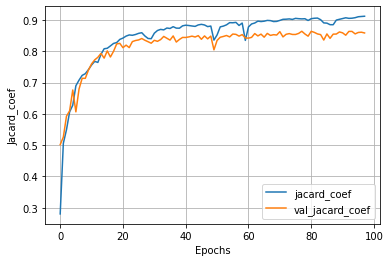

In [40]:
#Display of the Jaccard coeficient of the model over the training epochs
plt.plot(results_2.history['jacard_coef'],label='jacard_coef')
plt.plot(results_2.history['val_jacard_coef'],label='val_jacard_coef')

plt.xlabel('Epochs')
plt.ylabel('Jacard_coef')
plt.legend()
plt.grid()
plt.show()

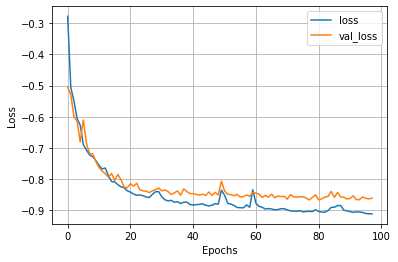

In [41]:
#Display of the loss of the model over the training epochs
plt.plot(results_2.history['loss'],label='loss')
plt.plot(results_2.history['val_loss'],label='val_loss')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

In [42]:
#Prediction over our test partition
preds_test=model.predict(np.array(X_test))

5/5 [==============================] - 1s 133ms/step


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


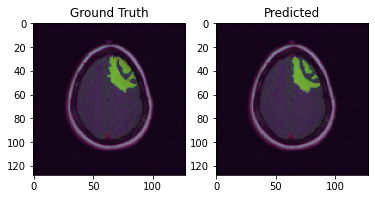

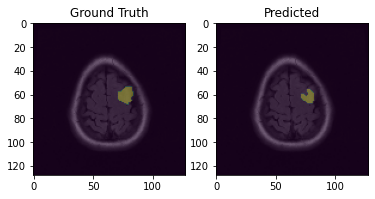

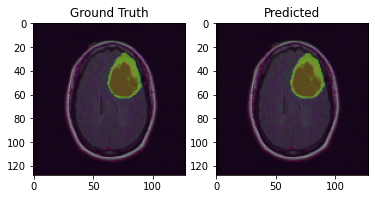

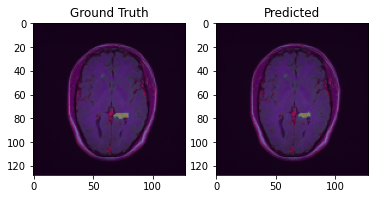

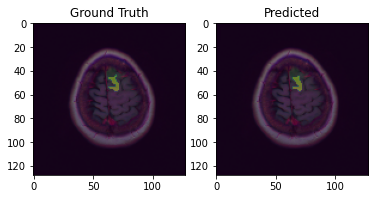

...

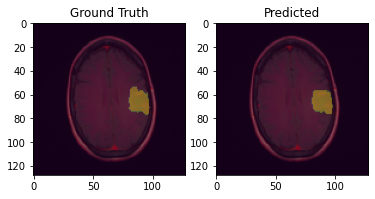

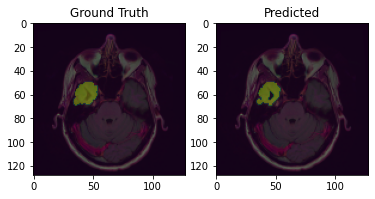

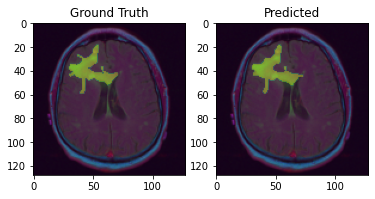

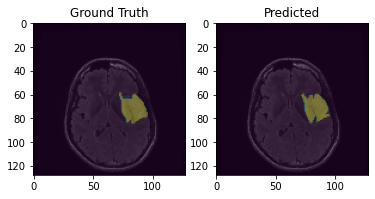

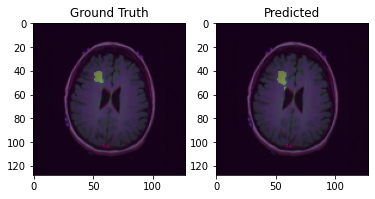

In [43]:
#Visualization of the results of the model
for ind in range(0,50):
  seg_plot(X_test[ind],y_test[ind].squeeze(),np.around(preds_test[ind].squeeze()))

#Data Augmentation

In case, we want to implement Data Augmentation here are a few cell where we enlarge the dataset with this technique by aplying random rotations at the images.

In [44]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.33, random_state=42)

In [45]:
from keras_preprocessing.image import ImageDataGenerator

datagen=ImageDataGenerator(rotation_range=90,horizontal_flip=True,vertical_flip=True)
datagen.fit(X_train)

In [46]:
seed=0  

image_train_generator =datagen.flow(X_train,batch_size=64,seed=seed)
mask_train_generator = datagen.flow(np.expand_dims(y_train,axis=3),batch_size=64,seed=seed)

train_generator = zip(image_train_generator, mask_train_generator)

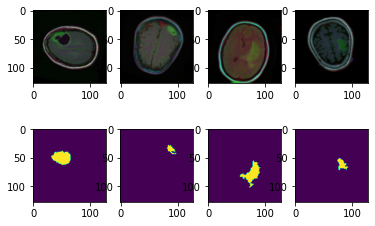

In [47]:
n_images=4

#Plots our figures
for i in range(1,n_images+1):
  plt.subplot(2, n_images, i)
  image_batch = image_train_generator.next()
  image_ = image_batch[0].astype('uint8')
  plt.imshow(image_)

  plt.subplot(2, n_images, n_images+i)
  mask_batch = mask_train_generator.next()
  image_ = mask_batch[0].astype('uint8').squeeze()
  plt.imshow(image_)
#plt.show()

In [48]:
#Now, we set the model's loss with the Jaccard metric 
set_seed(0)
model=unet_model(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS,init,act=tf.keras.layers.LeakyReLU(alpha=0.1),dropout_level=0)
model.compile(optimizer = 'adam', loss = [jacard_coef_loss], metrics = [jacard_coef,'accuracy',])

In [49]:
#Training of the model
callbacks = [tf.keras.callbacks.EarlyStopping(patience=20, monitor='val_jacard_coef',mode='max'),tf.keras.callbacks.TensorBoard(log_dir='logs')]

results_3 = model.fit(train_generator,validation_data=(X_val,y_val), batch_size=1, steps_per_epoch=50, epochs=200, callbacks=callbacks)

Epoch 1/200
50/50 [==============================] - 25s 425ms/step - loss: -0.2553 - jacard_coef: 0.2555 - accuracy: 0.7312 - val_loss: -0.3967 - val_jacard_coef: 0.3967 - val_accuracy: 0.9816
Epoch 2/200
50/50 [==============================] - 17s 337ms/step - loss: -0.5427 - jacard_coef: 0.5429 - accuracy: 0.9768 - val_loss: -0.4831 - val_jacard_coef: 0.4831 - val_accuracy: 0.9842
Epoch 3/200
50/50 [==============================] - 17s 337ms/step - loss: -0.6062 - jacard_coef: 0.6062 - accuracy: 0.9803 - val_loss: -0.5180 - val_jacard_coef: 0.5180 - val_accuracy: 0.9852
Epoch 4/200
50/50 [==============================] - 18s 356ms/step - loss: -0.6414 - jacard_coef: 0.6413 - accuracy: 0.9818 - val_loss: -0.5619 - val_jacard_coef: 0.5619 - val_accuracy: 0.9890
Epoch 5/200
50/50 [==============================] - 17s 338ms/step - loss: -0.6807 - jacard_coef: 0.6806 - accuracy: 0.9833 - val_loss: -0.5709 - val_jacard_coef: 0.5709 - val_accuracy: 0.9882
Epoch 6/200
50/50 [===========

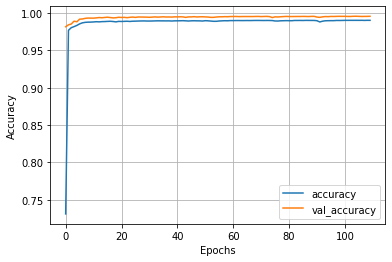

In [50]:
#Display of the accuracy of the model over the training epochs
plt.plot(results_3.history['accuracy'],label='accuracy')
plt.plot(results_3.history['val_accuracy'],label='val_accuracy')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()

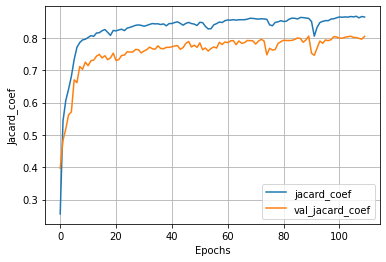

In [51]:
#Display of the Jaccard coeficient of the model over the training epochs
plt.plot(results_3.history['jacard_coef'],label='jacard_coef')
plt.plot(results_3.history['val_jacard_coef'],label='val_jacard_coef')

plt.xlabel('Epochs')
plt.ylabel('Jacard_coef')
plt.legend()
plt.grid()
plt.show()

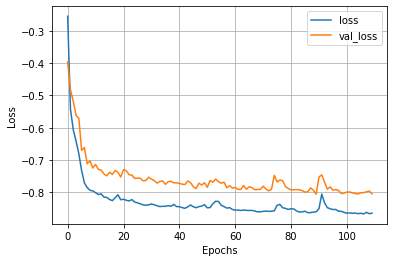

In [52]:
#Display of the loss of the model over the training epochs
plt.plot(results_3.history['loss'],label='loss')
plt.plot(results_3.history['val_loss'],label='val_loss')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

In [53]:
#Prediction over our test partition
preds_test=model.predict(np.array(X_test))

5/5 [==============================] - 0s 30ms/step


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


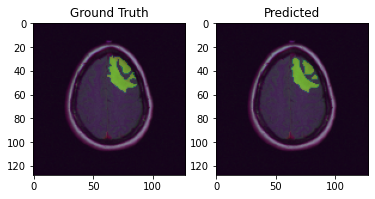

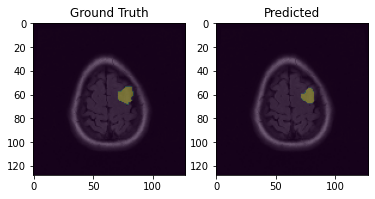

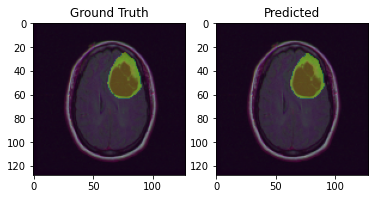

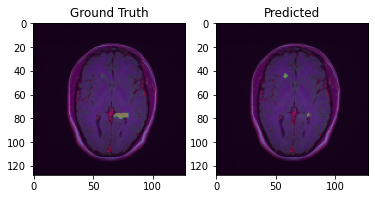

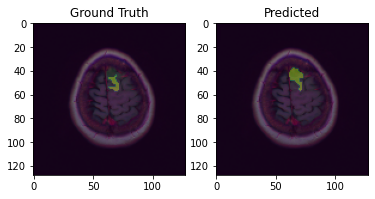

...

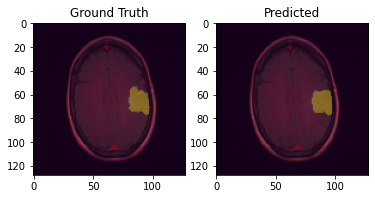

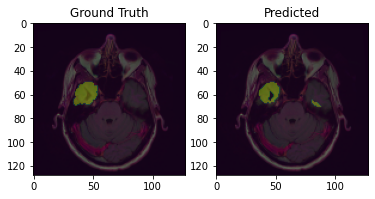

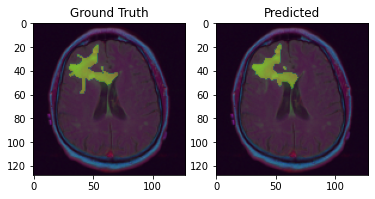

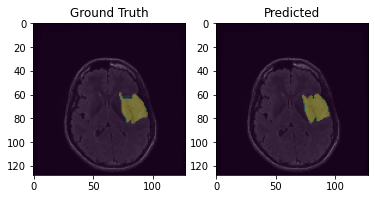

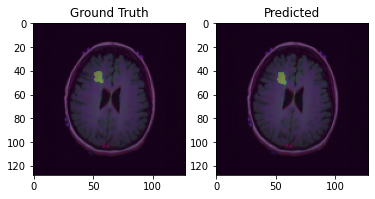

In [54]:
#Visualization of the results of the model
for ind in range(0,50):
  seg_plot(X_test[ind],y_test[ind].squeeze(),np.around(preds_test[ind].squeeze()))

#Comparison of results

Now, we are going to make a comparison between the three models we have trained in this notebook which are:

- Model 1 -> Default model with binary crossentropy as loss function and dropout regularization. Default arranged dataset.

- Model 2 -> Default model with custom Jaccard loss function and dropout regularization. Ramdomly arranged dataset.

- Model 3 -> Default model with custom Jaccard function and without dropout regularization. Data augmentation over randomly arranged dataset.

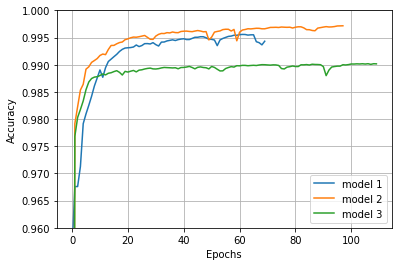

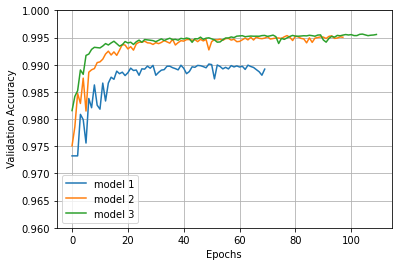

In [55]:
#Display of the accuracy of all the models trained over the training epochs
plt.plot(results_1.history['accuracy'],label='model 1')
plt.plot(results_2.history['accuracy'],label='model 2')
plt.plot(results_3.history['accuracy'],label='model 3')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.ylim(0.96,1)
plt.legend()
plt.grid()
plt.show()

plt.plot(results_1.history['val_accuracy'],label='model 1')
plt.plot(results_2.history['val_accuracy'],label='model 2')
plt.plot(results_3.history['val_accuracy'],label='model 3')

plt.xlabel('Epochs')
plt.ylabel(' Validation Accuracy')
plt.ylim(0.96,1)
plt.legend()
plt.grid()
plt.show()

What we can observe in the accuracy metric is that models 2 and 3 have better validation accuracy than model 1. Model 3 have slightly better validation accuracy performance than model 2, which means it can generalize slightly better the problem we have taught it to solve in terms of accuracy. 

What we can observe in model 1 is that we have better accuracy metrics in the training subset over the validation subset of the dataset, fact that could tell us that some kind of overfitting is happening in model 1.

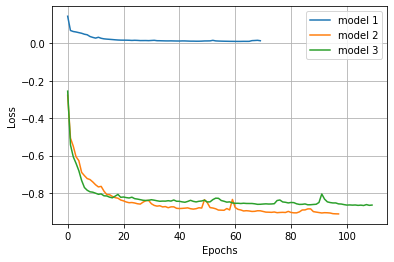

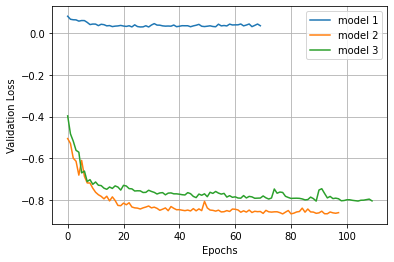

In [56]:
#Display of the loss of all the models trained over the training epochs
plt.plot(results_1.history['loss'],label='model 1')
plt.plot(results_2.history['loss'],label='model 2')
plt.plot(results_3.history['loss'],label='model 3')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()

plt.plot(results_1.history['val_loss'],label='model 1')
plt.plot(results_2.history['val_loss'],label='model 2')
plt.plot(results_3.history['val_loss'],label='model 3')

plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.grid()
plt.show()

Model 1, compared to model 2 and 3, have different losses, so these group of models are not comparable in terms of loss. But between model 2 and 3, we can observe that model 2 reach better results in terms of loss, in the validation and training subsets.

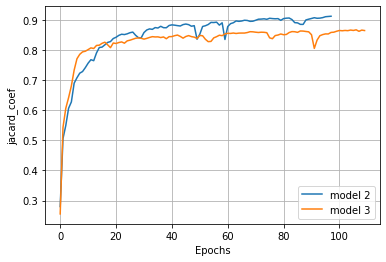

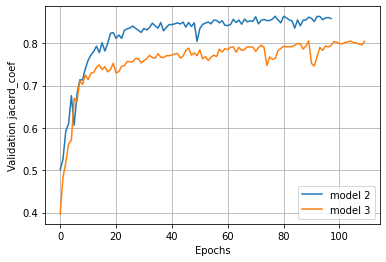

In [57]:
#Display of the jacard_coef of all the models trained over the training epochs
plt.plot(results_2.history['jacard_coef'],label='model 2')
plt.plot(results_3.history['jacard_coef'],label='model 3')

plt.xlabel('Epochs')
plt.ylabel('jacard_coef')
plt.legend()
plt.grid()
plt.show()

plt.plot(results_2.history['val_jacard_coef'],label='model 2')
plt.plot(results_3.history['val_jacard_coef'],label='model 3')

plt.xlabel('Epochs')
plt.ylabel('Validation jacard_coef')
plt.legend()
plt.grid()
plt.show()

And finally, in terms of Jaccard coefficient, our model 2 reach better results that model 3, in the training and validation subsets.
So, in the end, our model 3 only have slightly better results that model 2 in the validation accuracy.

In terms of everything, we can observe that model 2 reach better results in every other metric, so in generals terms, we can say that model 2 is the best model that we have trained in this notebook.

Some things that we can do to improve this model is the refinement of the dataset we are going to fit to the algorithm, maybe if we feed better images, which could be made in the same mri machine with the same settings everytime, we can reach better results, we can enlarge the quantity of the images in the dataset, we could feed the neural network images with more resolutions, but at the costs of longer training times, and we could need a GPU for larger resolution images. Also, we could try different types of architectures for the neural network, maybe it needs more layers or number of neurons in each layer. We could tweak regularization parameters, such as dropout level in some layers, data augmentation parameters, L1 and L2 to squeeze a little bit of accuracy for a better model...